In [2]:
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install opencv-python

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

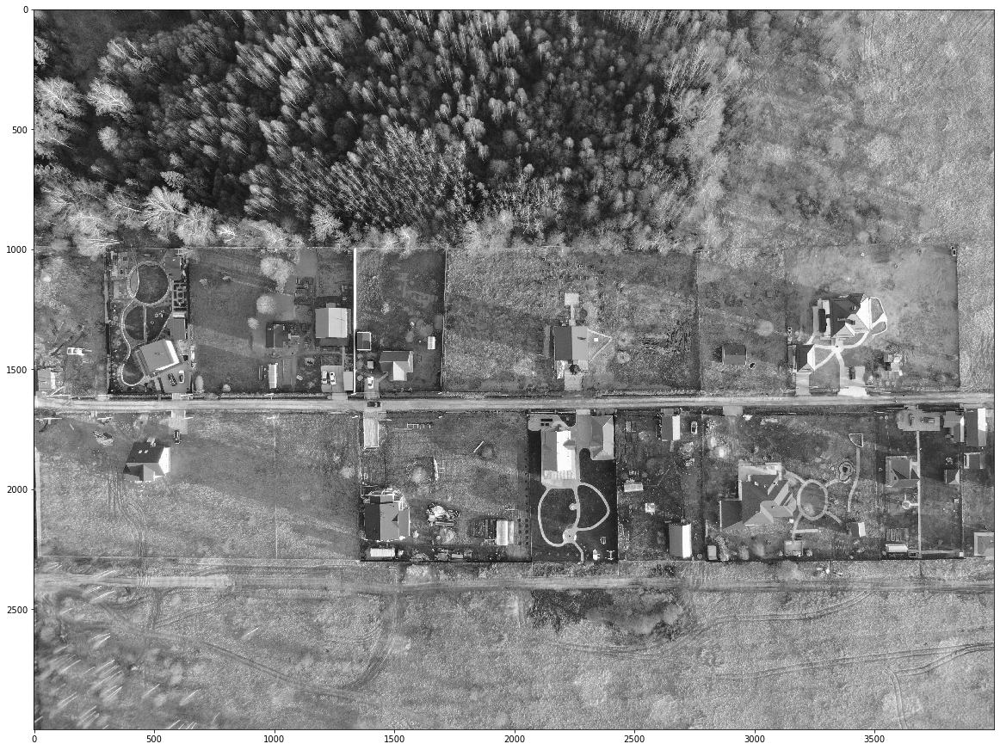

In [2]:
image_gray = cv2.imread("DJI_0024.JPG", cv2.IMREAD_GRAYSCALE)
plt.figure(figsize = (20, 20))
plt.imshow(image_gray, cmap='gray')

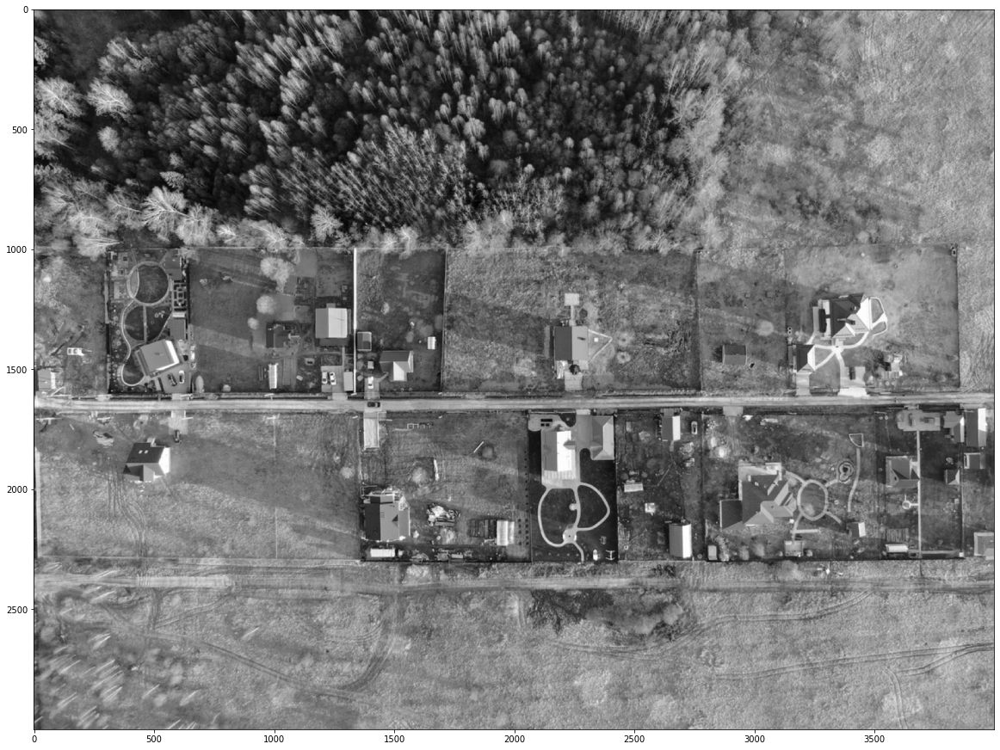

In [3]:
image_blurry = cv2.blur(image_gray, (6,6))
plt.figure(figsize = (20, 20))
plt.imshow(image_blurry, cmap='gray')

## 1) Детектор краев методом Д.Ф. Кэнни

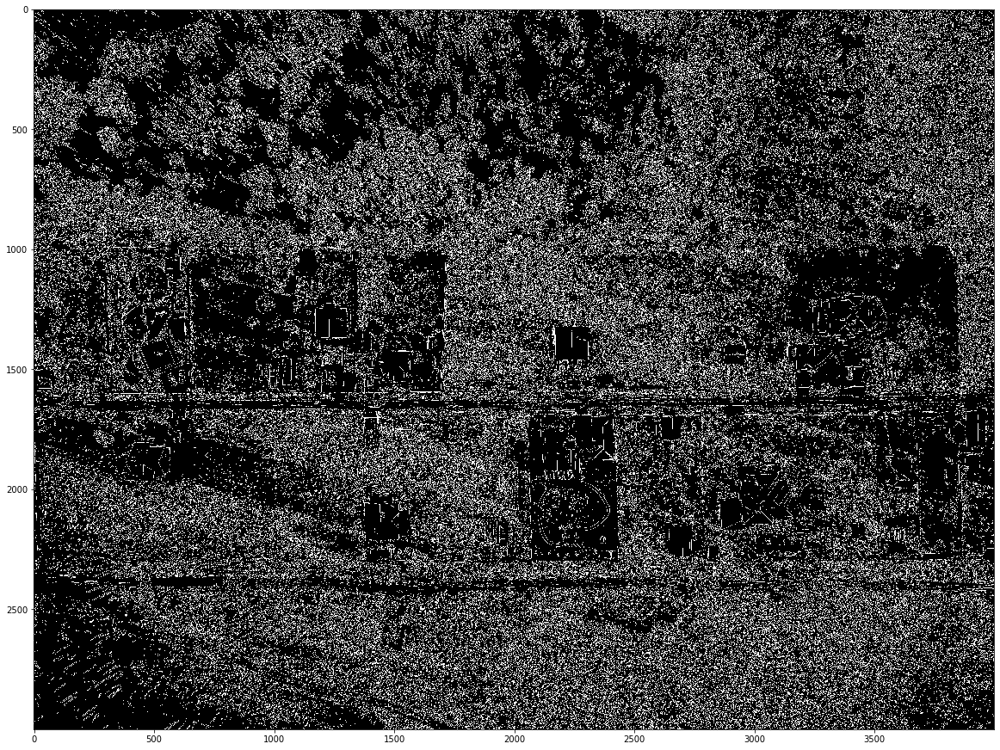

In [4]:
# медиана интенсивности
median_intensity = np.median(image_gray)

#пороговое значение в 1 станд. откл.
lower_threshold = int(max(0, (1 - 0.33) * median_intensity))
upper_threshold = int(min(255, (1 + 0.33) * median_intensity))
# Детектор Кэнни
result_Canny = cv2.Canny(image_gray, lower_threshold, upper_threshold)

plt.figure(figsize = (20, 20))
plt.imshow(result_Canny, cmap = 'gray')

In [5]:
cv2.imwrite('Canny_native.jpg', result_Canny)

True

## Детектор углов Харриса

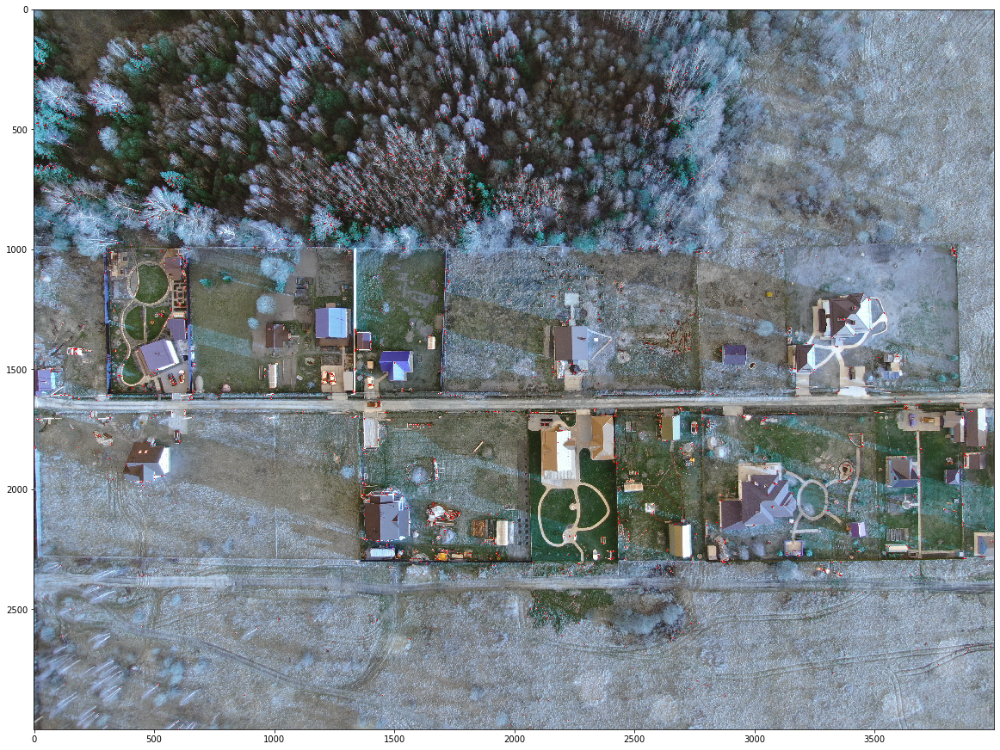

In [6]:
block_size = 2
aperture = 29
free_parameter = 0.04

detector = cv2.cornerHarris(image_gray, block_size, aperture, free_parameter)

threshold = 0.01

image_threshold = cv2.imread("DJI_0024.JPG")
image_threshold[detector > threshold * detector.max()] = [255, 0, 0]

plt.figure(figsize = (20, 20))
plt.imshow(image_threshold, cmap = 'gray')

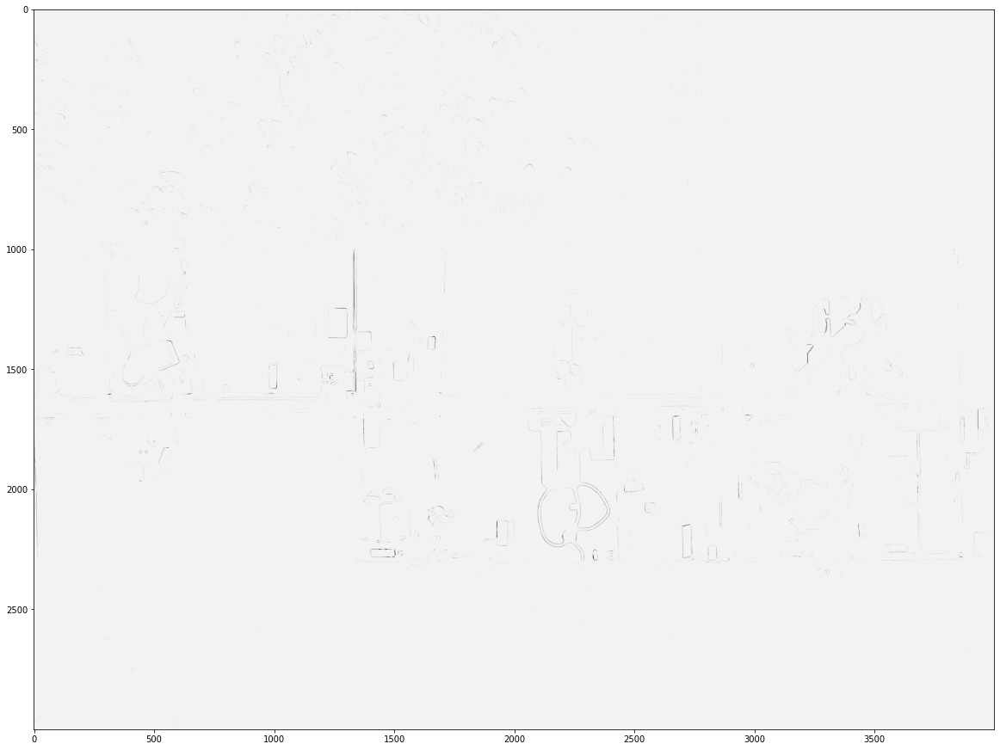

In [7]:
plt.figure(figsize = (20, 20))
plt.imshow(detector, cmap = 'gray')

In [8]:
cv2.imwrite('Harris.jpg', image_threshold)

True

## Детектор углов Ши-Томаззи

In [9]:
#кол-во искомых углов
corners_to_detect = 500

min_qualt_score = 0.05
min_dist = 50

corners = cv2.goodFeaturesToTrack(image_gray, corners_to_detect, min_qualt_score, min_dist)
corners = np.float32(corners)

In [10]:
image_corn = cv2.imread("DJI_0024.JPG")
for corner in corners:
    x, y = corner[0]
    cv2.circle(image_corn, (x, y), 10, (255, 0, 0), -1)

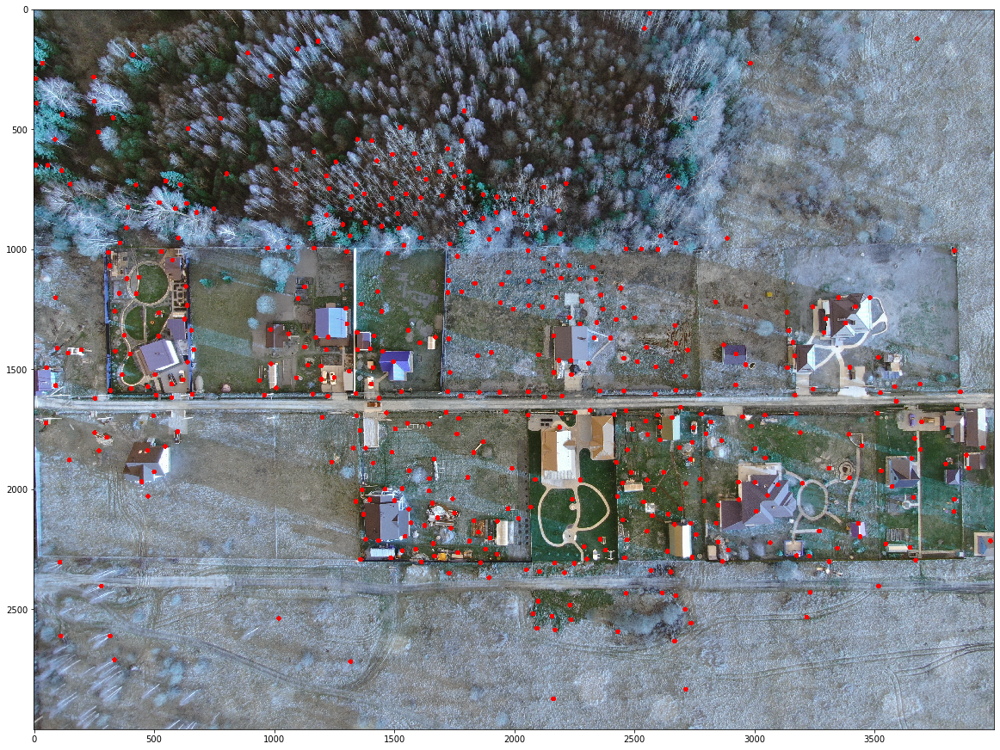

In [11]:
plt.figure(figsize = (20, 20))
plt.imshow(image_corn, cmap = 'gray')

In [ ]:
import cv2

image = cv2.imread('DJI_0024.JPG')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
thresh = cv2.threshold(blurred, 240 ,255, cv2.THRESH_BINARY_INV)[1]
canny = cv2.Canny(thresh, 50, 255, 1)

cnts = cv2.findContours(canny, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

for c in cnts:
    cv2.drawContours(image,[c], 0, (36,255,12), 2)

cv2.imshow('thresh', thresh)
cv2.imshow('canny', canny)
cv2.imshow('image', image)
cv2.imwrite('thresh.png', thresh)
cv2.imwrite('canny.png', canny)
cv2.imwrite('image.png', image)
cv2.waitKey(0)